# Img2Img translation experiments

# Device

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

device = "cuda"

# Imports

In [41]:
import os
import random
from datetime import datetime
from math import ceil
from pathlib import Path
from typing import Literal, Tuple, Union
from warnings import warn

import matplotlib.animation as animation
import matplotlib.pyplot as plt
import numpy as np
import torch
from diffusers import DDIMInverseScheduler, DDIMScheduler
from diffusers.models import UNet2DModel
from diffusers.models.unet_2d import UNet2DOutput
from IPython.core.display import HTML
from PIL import Image
from torchvision import transforms
from tqdm.auto import tqdm
from torchvision.datasets import ImageFolder

from src.pipeline_conditional_ddim import ConditionialDDIMPipeline
from src.cond_unet_2d import CondUNet2DModel

# Load pretrained pipeline

In [3]:
path = Path("experiments", "DMSO_vs_cyto30_cond_gen", "full_pipeline_save")
assert path.exists()

In [4]:
pipeline = ConditionialDDIMPipeline.from_pretrained(path)
unet = pipeline.unet.to(device)
scheduler = pipeline.scheduler

# Common params

In [5]:
batch_size = 256  # RTX 8000

# Base algorithm: Inverse DDIM

From https://arxiv.org/pdf/2105.05233.pdf#appendix.F. 

In order to interpolate between given images, we need to find the latent that would map to each sample.

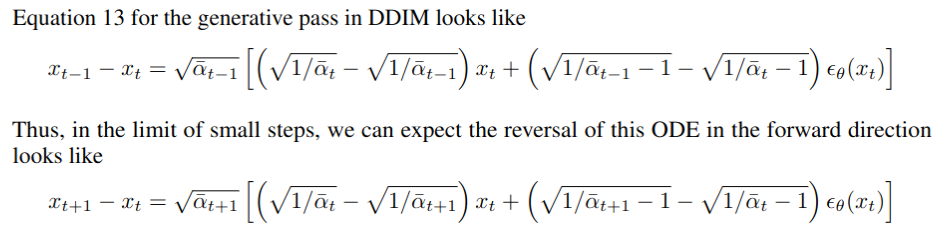

The authors use 250 "reverse" steps (that is, to noise the image? *"reverse"* normally means from Gaussian to data), and only "reverse" the first 249 *(reverse?)* steps.  
The noise artifacts they see when rev-reverse-reversing looks like a bug IMHO.

### Randomly load two samples from specified classes

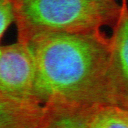

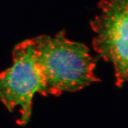

In [22]:
folder1 = "data/BBBC021_comp_conc_nice_phen_datalink/train/DMSO/"
folder2 = "data/BBBC021_comp_conc_nice_phen_datalink/train/cytochalasin B_30.0/"

class_label1 = torch.tensor(0, device=device)
class_label2 = torch.tensor(1, device=device)

sample1_path = random.sample(os.listdir(folder1), 1)[0]
sample2_path = random.sample(os.listdir(folder2), 1)[0]

preprocess = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),  # map to [-1, 1] for SiLU
    ]
)

sample1_to_show = Image.open(folder1 + sample1_path).convert("RGB")
sample2_to_show = Image.open(folder2 + sample2_path).convert("RGB")
display(sample1_to_show)
display(sample2_to_show)

sample1 = preprocess(Image.open(folder1 + sample1_path).convert("RGB")).to(device)
sample2 = preprocess(Image.open(folder2 + sample2_path).convert("RGB")).to(device)

#### Get inversed latents

In [27]:
nb_noising_iter = 1000  # higher values give much better results (but take longer)
# should be in the range [1; scheduler.timesteps.max() + 1]
assert nb_noising_iter <= scheduler.timesteps.max().item() + 1

In [28]:
inv_scheduler = DDIMInverseScheduler().from_config(scheduler.config)
inv_scheduler.set_timesteps(nb_noising_iter)  # let's be as precise as possible

with torch.no_grad():
    latent1 = sample1.view(1, 3, 128, 128)
    latent2 = sample2.view(1, 3, 128, 128)

    for t in tqdm(inv_scheduler.timesteps, desc="Inverting to latent space..."):
        model_output_1 = unet(latent1, t, class_label1).sample

        latent1 = inv_scheduler.step(
            model_output_1,
            t,
            latent1,
        ).prev_sample

        model_output_2 = unet(latent2, t, class_label2).sample

        latent2 = inv_scheduler.step(
            model_output_2,
            t,
            latent2,
        ).prev_sample

Inverting to latent space...:   0%|          | 0/1000 [00:00<?, ?it/s]

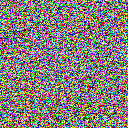

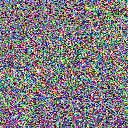

In [29]:
latent1_to_show = (latent1 / 2 + 0.5).clamp(0, 1)
latent1_to_show = latent1_to_show.cpu().permute(0, 2, 3, 1).numpy()
latent1_to_show = pipeline.numpy_to_pil(latent1_to_show)[0]
display(latent1_to_show)
latent2_to_show = (latent2 / 2 + 0.5).clamp(0, 1)
latent2_to_show = latent2_to_show.cpu().permute(0, 2, 3, 1).numpy()
latent2_to_show = pipeline.numpy_to_pil(latent2_to_show)[0]
display(latent2_to_show)

The cytochalasin B_30.0 sample is typically much less correctly Gaussian'ned than the DMSO one, indicating that the network performs worse on cytochalasin B_30.0 than on DMSO. 

In [30]:
# Check Gaussianity
print(latent1.mean().item(), latent1.std().item())
print(latent2.mean().item(), latent2.std().item())

0.005530468188226223 0.9966434240341187
-0.01387004368007183 1.036750078201294


#### Regenerate

In [31]:
scheduler.set_timesteps(nb_noising_iter)

with torch.no_grad():
    inv_sample1 = latent1
    inv_sample2 = latent2

    for t in tqdm(scheduler.timesteps, desc="Denoising"):
        # 1. predict noise model_output
        model_output_1 = unet(inv_sample1, t, class_label1).sample
        model_output_2 = unet(inv_sample2, t, class_label2).sample

        # 2. predict previous mean of image x_t-1 and add variance depending on eta
        # eta corresponds to η in paper and should be between [0, 1]
        # do x_t -> x_t-1
        inv_sample1 = scheduler.step(
            model_output_1,
            t,
            inv_sample1,
        ).prev_sample

        inv_sample2 = scheduler.step(
            model_output_2,
            t,
            inv_sample2,
        ).prev_sample

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

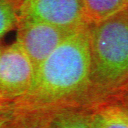

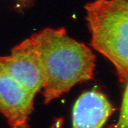

In [32]:
inv_sample1_to_show = (inv_sample1 / 2 + 0.5).clamp(0, 1)
inv_sample1_to_show = inv_sample1_to_show.cpu().permute(0, 2, 3, 1).numpy()
inv_sample1_to_show = pipeline.numpy_to_pil(inv_sample1_to_show)[0]
display(inv_sample1_to_show)
inv_sample2_to_show = (inv_sample2 / 2 + 0.5).clamp(0, 1)
inv_sample2_to_show = inv_sample2_to_show.cpu().permute(0, 2, 3, 1).numpy()
inv_sample2_to_show = pipeline.numpy_to_pil(inv_sample2_to_show)[0]
display(inv_sample2_to_show)

Let's assess and compare the inversion performance:

sample 1:


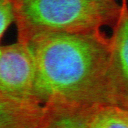

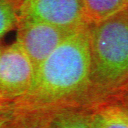

sample 2:


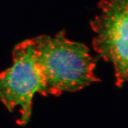

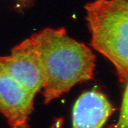

In [33]:
print("sample 1:")
display(Image.open(folder1 + sample1_path).convert("RGB"))
display(inv_sample1_to_show)
print("sample 2:")
display(Image.open(folder2 + sample2_path).convert("RGB"))
display(inv_sample2_to_show)

Reconstruction error:

In [34]:
print(torch.linalg.norm(sample1 - inv_sample1).item())
print(torch.linalg.norm(sample2 - inv_sample2).item())

68.7304458618164
105.11063385009766


Rather close but still quite different... For "reference":

In [35]:
torch.linalg.norm(torch.randn_like(sample1) - torch.randn_like(sample1)).item()

312.7452087402344

# Interpolate along classes and samples

## Directly take class embeddings as input

Simply change the `unet`'s forward pass to directly take class *embeddings* as input, instead of the class *labels*.

Note that using a `UNet2DConditionModel` instead of a `UNet2DModel` would cover all use cases...

In [ ]:
def cstm_cond_forwad(
    self,
    sample: torch.FloatTensor,
    timestep: Union[torch.Tensor, float, int],
    class_embeddings: torch.Tensor,
    return_dict: bool = True,
) -> Union[UNet2DOutput, Tuple]:
    r"""
    Args:
        sample (`torch.FloatTensor`):
            (batch, channel, height, width) noisy inputs tensor
        timestep (`torch.FloatTensor` or `float` or `int`):
            (batch) timesteps
        class_embeddings (`torch.FloatTensor`):
            (batch, 1, embedding_dim) or (batch, embedding_dim) Class embeddings for conditioning. Summed with the timestep embeddings.
        return_dict (`bool`, *optional*, defaults to `True`):
            Whether or not to return a [`~models.unet_2d.UNet2DOutput`] instead of a plain tuple.

    Returns:
        [`~models.unet_2d.UNet2DOutput`] or `tuple`: [`~models.unet_2d.UNet2DOutput`] if `return_dict` is True,
        otherwise a `tuple`. When returning a tuple, the first element is the sample tensor.
    """
    # 0. center input if necessary
    if self.config.center_input_sample:
        sample = 2 * sample - 1.0

    # 1. time
    timesteps = timestep
    if not torch.is_tensor(timesteps):
        timesteps = torch.tensor([timesteps], dtype=torch.long, device=sample.device)
    elif torch.is_tensor(timesteps) and len(timesteps.shape) == 0:
        timesteps = timesteps[None].to(sample.device)

    # broadcast to batch dimension in a way that's compatible with ONNX/Core ML
    timesteps = timesteps * torch.ones(
        sample.shape[0], dtype=timesteps.dtype, device=timesteps.device
    )

    t_emb = self.time_proj(timesteps)

    # timesteps does not contain any weights and will always return f32 tensors
    # but time_embedding might actually be running in fp16. so we need to cast here.
    # there might be better ways to encapsulate this.
    t_emb = t_emb.to(dtype=self.dtype)
    emb = self.time_embedding(t_emb)

    # >>>Remove checks & original logic<<<
    # if self.class_embedding is not None:
    #     if class_labels is None:
    #         raise ValueError(
    #             "class_labels should be provided when doing class conditioning"
    #         )

    #     if self.config.class_embed_type == "timestep":
    #         class_labels = self.time_proj(class_labels)

    #     class_emb = self.class_embedding(class_labels).to(dtype=self.dtype)
    #     emb = emb + class_emb

    if len(class_embeddings.shape) == 3 and class_embeddings.shape[1] == 1:
        class_embeddings = class_embeddings.view(class_embeddings.shape[0], -1)
    emb += class_embeddings

    # 2. pre-process
    skip_sample = sample
    sample = self.conv_in(sample)

    # 3. down
    down_block_res_samples = (sample,)
    for downsample_block in self.down_blocks:
        if hasattr(downsample_block, "skip_conv"):
            sample, res_samples, skip_sample = downsample_block(
                hidden_states=sample, temb=emb, skip_sample=skip_sample
            )
        else:
            sample, res_samples = downsample_block(hidden_states=sample, temb=emb)

        down_block_res_samples += res_samples

    # 4. mid
    sample = self.mid_block(sample, emb)

    # 5. up
    skip_sample = None
    for upsample_block in self.up_blocks:
        res_samples = down_block_res_samples[-len(upsample_block.resnets) :]
        down_block_res_samples = down_block_res_samples[: -len(upsample_block.resnets)]

        if hasattr(upsample_block, "skip_conv"):
            sample, skip_sample = upsample_block(sample, res_samples, emb, skip_sample)
        else:
            sample = upsample_block(sample, res_samples, emb)

    # 6. post-process
    sample = self.conv_norm_out(sample)
    sample = self.conv_act(sample)
    sample = self.conv_out(sample)

    if skip_sample is not None:
        sample += skip_sample

    if self.config.time_embedding_type == "fourier":
        timesteps = timesteps.reshape((sample.shape[0], *([1] * len(sample.shape[1:]))))
        sample = sample / timesteps

    if not return_dict:
        return (sample,)

    return UNet2DOutput(sample=sample)

In [ ]:
UNet2DModel.cond_forward = cstm_cond_forwad

## Get base class embeddings

In [ ]:
DMSO_embedding = unet.class_embedding(torch.tensor([0], device=device))
cyto_B30_embedding = unet.class_embedding(torch.tensor([1], device=device))

## Interpolate

In [ ]:
nb_generated_samples = 100
num_inference_steps = 100

In [ ]:
image_list = []
interp_traj = np.linspace(0, 1, nb_generated_samples)


batches: list[int] = [batch_size] * (nb_generated_samples // batch_size) + [
    nb_generated_samples % batch_size
]

# set step values
scheduler.set_timesteps(num_inference_steps)

with torch.no_grad():
    for i, actual_bs in enumerate(tqdm(batches, desc="Batch")):
        batch_idxes = range(i * batch_size, i * batch_size + batches[i])
        x_batch = interp_traj[batch_idxes]

        # get interpolated latents
        latent = [(1 - x) * latent1 + x * latent2 for x in x_batch]
        latent = torch.cat(latent)

        # get interpolated class embeddings
        class_embedding = [
            ((1 - x) * DMSO_embedding + x * cyto_B30_embedding) for x in x_batch
        ]
        class_embedding = torch.stack(class_embedding)

        for t in tqdm(scheduler.timesteps):
            # 1. predict noise model_output
            model_output = unet.cond_forward(latent, t, class_embedding).sample

            # 2. predict previous mean of image x_t-1 and add variance depending on eta
            # eta corresponds to η in paper and should be between [0, 1]
            # do x_t -> x_t-1
            latent = scheduler.step(
                model_output,
                t,
                latent,
            ).prev_sample

        latent = (latent / 2 + 0.5).clamp(0, 1)
        latent = latent.cpu().permute(0, 2, 3, 1).numpy()
        latent = pipeline.numpy_to_pil(latent)

        image_list += latent

## Viz

Real size

In [ ]:
px = 1 / plt.rcParams["figure.dpi"]  # pixel in inches
fig, ax = plt.subplots(figsize=(128 * px, 128 * px))

ax.imshow(image_list[0])  # show an initial one first

# ims is a list of lists, each row is a list of artists to draw in the
# current frame; here we are just animating one artist, the image, in
# each frame
ims = [[ax.imshow(image, animated=True, interpolation=None)] for image in image_list]

ax.axis("off")

ani = animation.ArtistAnimation(fig, ims, interval=500, blit=True, repeat_delay=3000)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.close()

HTML(ani.to_jshtml())

Bigger (but still without "pixel interpolation")

In [ ]:
px = 1 / plt.rcParams["figure.dpi"]  # pixel in inches
fig, ax = plt.subplots(figsize=(6, 6))

ax.imshow(image_list[0])  # show an initial one first

# ims is a list of lists, each row is a list of artists to draw in the
# current frame; here we are just animating one artist, the image, in
# each frame
ims = [[ax.imshow(image, animated=True, interpolation=None)] for image in image_list]

ax.axis("off")

ani = animation.ArtistAnimation(fig, ims, interval=10, blit=True)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.close()

HTML(ani.to_jshtml())

# Interpolate along classes only with "classifier" guidance

In the absence of a pretrained classifier, let's try to use a simple $L_2$ norm between the original image and the generated one as a guidance signal for the diffusion process.

## Guidance loss

In [ ]:
def Lp_loss(
    x: torch.Tensor, y: torch.Tensor, p: int | float | Literal["inf", "-inf"] = 2
) -> torch.Tensor:
    """Returns the L_p norms of the flattened `(x[i] - y)` vectors for each `i` in the batch.

    Arguments
    ---------
    - x: `torch.Tensor`, shape `(N, C, H, W)`
    - y: `torch.Tensor`, shape `(C, H, W)`
    - p: `int | float | "inf" | "-inf"`, default `2`

    Returns
    -------
    `torch.linalg.vector_norm(x - y, dim=(1, 2, 3), ord=p)`, that is:
    ```
        torch.linalg.vector_norm(x[i] - y, ord=p) for i in range(N)
    ```
    """
    return torch.linalg.vector_norm(x - y, dim=(1, 2, 3), ord=p)

## Generate interpolated images

In [ ]:
num_inference_steps = 50
nb_generated_samples = 100
# typically much lower (e.g. 0.01) for L1 than L2 (e.g. 0.1)
guidance_loss_scale = 0.005
batch_size = 16  # 44GB (e.g. RTX 8000)
p = 1

In [ ]:
image_list = []
interp_traj = np.linspace(0, 1, nb_generated_samples)

batches: list[int] = [batch_size for i in range(nb_generated_samples // batch_size)] + [
    nb_generated_samples % batch_size
]

# set step values
scheduler.set_timesteps(num_inference_steps)

for i, actual_bs in enumerate(tqdm(batches, desc="Batch")):
    print(f"====================\nBatch {i + 1}/{len(batches)}")
    batch_idxes = range(i * batch_size, i * batch_size + batches[i])
    x_batch = interp_traj[batch_idxes]

    image = latent1.clone().detach().repeat(batches[i], 1, 1, 1)

    # get interpolated class embedding
    class_embedding = [
        ((1 - x) * DMSO_embedding + x * cyto_B30_embedding) for x in x_batch
    ]
    class_embedding = torch.cat(class_embedding)

    for j, t in enumerate(tqdm(scheduler.timesteps, leave=False)):
        # 0. require grad on image
        image = image.detach().requires_grad_()

        # 1. predict noise model_output
        model_output = unet.cond_forward(image, t, class_embedding).sample

        # 2. get x_0 prediction
        x0 = scheduler.step(
            model_output,
            t,
            image,
        ).pred_original_sample

        # 3. compute loss
        # each image in batch has its own loss with respect to the original sample
        # hence losses.shape = (batch_size,)
        losses = Lp_loss(x0, sample1, p) * guidance_loss_scale
        if j % 10 == 0:
            print(
                f"Timestep {j} | mean guidance loss: {round(losses.mean().item(), 3)}"
            )

        # 4. get gradient
        losses_seq = [losses[i] for i in range(batches[i])]
        guidance_grad = torch.autograd.grad(losses_seq, image)[0]

        # 5. modify the image based on this gradient
        image = image.detach() - guidance_grad

        # 6. x_t -> x_t-1
        image = scheduler.step(
            model_output,
            t,
            image,
        ).prev_sample

    image = (image.detach() / 2 + 0.5).clamp(0, 1)
    image = image.permute(0, 2, 3, 1).cpu().numpy()
    image = pipeline.numpy_to_pil(image)

    image_list += image

## Visualize

### Grid

In [ ]:
# n_cols = 10
# n_rows = ceil(nb_generated_samples / 10)

In [ ]:
# fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 2 * n_rows))
# for i in range(nb_generated_samples):
#     row = i // 10
#     col = i % 10
#     ax = axes[row, col]
#     ax.imshow(image_list[i])
#     ax.axis("off")
#     if i == 0:
#         ax.set_title(f"DMSO")
#     elif i == nb_generated_samples - 1:
#         ax.set_title(f"cyto_B30")

### Interactive

In [ ]:
px = 1 / plt.rcParams["figure.dpi"]  # pixel in inches
fig, ax = plt.subplots(figsize=(128 * px, 128 * px))

ax.imshow(image_list[0])  # show an initial one first

# ims is a list of lists, each row is a list of artists to draw in the
# current frame; here we are just animating one artist, the image, in
# each frame
ims = [[ax.imshow(image, animated=True, interpolation=None)] for image in image_list]

ax.axis("off")

ani = animation.ArtistAnimation(fig, ims, interval=500, blit=True, repeat_delay=3000)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.close()

HTML(ani.to_jshtml())

Bigger (but still without "pixel interpolation")

In [ ]:
px = 1 / plt.rcParams["figure.dpi"]  # pixel in inches
fig, ax = plt.subplots(figsize=(6, 6))

ax.imshow(image_list[0])  # show an initial one first

# ims is a list of lists, each row is a list of artists to draw in the
# current frame; here we are just animating one artist, the image, in
# each frame
ims = [[ax.imshow(image, animated=True, interpolation=None)] for image in image_list]

ax.axis("off")

ani = animation.ArtistAnimation(fig, ims, interval=10, blit=True, repeat=False)

# Save the animation
save_path = "experiments/DMSO_vs_cyto30_cond_gen_interpolation/"
video_name = f"class_translation_guidance_L_{p}_nb_steps{num_inference_steps}_guid_scale{guidance_loss_scale}"
video_path = os.path.join(save_path, video_name)
video_formats = ["mkv", "mp4"]
for vid_format in video_formats:
    video_full_path = video_path + "." + vid_format
    if os.path.exists(video_full_path):
        timestamp = datetime.now().strftime("%Y-%m-%d-%H-%M-%S")
        warn(
            f"Video {video_full_path} already exists; writting to {video_path}-{timestamp}.{vid_format}"
        )
        ani.save(f"{video_path}-{timestamp}.{vid_format}", fps=5)
    else:
        ani.save(video_full_path, fps=5)

plt.close()

HTML(ani.to_jshtml())

Semantic conservation?

In [ ]:
display(sample1_to_show)

## Now from cyto to DMSO

In [ ]:
num_inference_steps = 50
nb_generated_samples = 100
# typically much lower (e.g. 0.01) for L1 than L2 (e.g. 0.1)
guidance_loss_scale = 0.001
batch_size = 32  # 44GB (e.g. RTX 8000)
p = 1

In [ ]:
image_list = []
tensor_list = []
interp_traj = np.linspace(0, 1, nb_generated_samples)

batches: list[int] = [batch_size for i in range(nb_generated_samples // batch_size)] + [
    nb_generated_samples % batch_size
]

# set step values
scheduler.set_timesteps(num_inference_steps)

for i, actual_bs in enumerate(tqdm(batches, desc="Batch")):
    print(f"====================\nBatch {i + 1}/{len(batches)}")
    batch_idxes = range(i * batch_size, i * batch_size + batches[i])
    x_batch = interp_traj[batch_idxes]

    image = latent2.clone().detach().repeat(batches[i], 1, 1, 1)

    # get interpolated class embedding
    class_embedding = [
        ((1 - x) * cyto_B30_embedding + x * DMSO_embedding) for x in x_batch
    ]
    class_embedding = torch.cat(class_embedding)

    for j, t in enumerate(tqdm(scheduler.timesteps, leave=False)):
        # 0. require grad on image
        image = image.detach().requires_grad_()

        # 1. predict noise model_output
        model_output = unet.cond_forward(image, t, class_embedding).sample

        # 2. get x_0 prediction
        x0 = scheduler.step(
            model_output,
            t,
            image,
        ).pred_original_sample

        # 3. compute loss
        # each image in batch has its own loss with respect to the original sample
        # hence losses.shape = (batch_size,)
        losses = Lp_loss(x0, sample2, p) * guidance_loss_scale
        if j % 10 == 0:
            print(
                f"Timestep {j} | mean guidance loss: {round(losses.mean().item(), 3)}"
            )

        # 4. get gradient
        losses_seq = [losses[i] for i in range(batches[i])]
        guidance_grad = torch.autograd.grad(losses_seq, image)[0]

        # 5. modify the image based on this gradient
        image = image.detach() - guidance_grad

        # 6. x_t -> x_t-1
        image = scheduler.step(
            model_output,
            t,
            image,
        ).prev_sample

    tensor_list.append(image.clone().detach())
    image = (image.detach() / 2 + 0.5).clamp(0, 1)
    image = image.permute(0, 2, 3, 1).cpu().numpy()
    image = pipeline.numpy_to_pil(image)

    image_list += image

In [ ]:
px = 1 / plt.rcParams["figure.dpi"]  # pixel in inches
fig, ax = plt.subplots(figsize=(6, 6))

ax.imshow(image_list[0])  # show an initial one first

# ims is a list of lists, each row is a list of artists to draw in the
# current frame; here we are just animating one artist, the image, in
# each frame
ims = [[ax.imshow(image, animated=True, interpolation=None)] for image in image_list]

ax.axis("off")

ani = animation.ArtistAnimation(fig, ims, interval=10, blit=True, repeat=False)

# Save the animation
save_path = "experiments/DMSO_vs_cyto30_cond_gen_interpolation/"
video_name = f"cyto_to_DMSO_class_translation_guidance_L_{p}_nb_steps{num_inference_steps}_guid_scale{guidance_loss_scale}"
video_path = os.path.join(save_path, video_name)
video_formats = ["mkv", "mp4"]
for vid_format in video_formats:
    video_full_path = video_path + "." + vid_format
    if os.path.exists(video_full_path):
        timestamp = datetime.now().strftime("%Y-%m-%d-%H-%M-%S")
        warn(
            f"Video {video_full_path} already exists; writting to {video_path}-{timestamp}.{vid_format}"
        )
        ani.save(f"{video_path}-{timestamp}.{vid_format}", fps=5)
    else:
        ani.save(video_full_path, fps=5)

plt.close()

HTML(ani.to_jshtml())

In [ ]:
display(sample2_to_show)
print(torch.linalg.vector_norm(sample2 - tensor_list[0]))

In [ ]:
image_list[0]

# Interpolate along samples only

This should work (*c.f.* the ["Interpolation in deterministic generative processes" section of the DDIM paper](https://arxiv.org/pdf/2010.02502.pdf#subsection.5.3)).

## Generate interpolated images

Let's generate latents from scratch since cycle consistency is not a thing yet. TODO: add guidance!

In [ ]:
image_shape = (
    unet.config.in_channels,
    unet.config.sample_size,
    unet.config.sample_size,
)
sample1_latent = torch.randn(image_shape)
sample2_latent = torch.randn(image_shape)

In [ ]:
@torch.no_grad()
def gen(unet, scheduler, latent, class_label):
    image = latent

    # set step values
    scheduler.set_timesteps(num_inference_steps)

    for t in tqdm(scheduler.timesteps, desc="Denoising", leave=False):
        # 1. predict noise model_output
        # fake batch
        model_output = unet(image, t, class_label).sample

        # 2. predict previous mean of image x_t-1 and add variance depending on eta
        # eta corresponds to η in paper and should be between [0, 1]
        # do x_t -> x_t-1
        image = scheduler.step(
            model_output,
            t,
            image,
        ).prev_sample

    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(0, 2, 3, 1).numpy()
    image = pipeline.numpy_to_pil(image)

    return image

In [ ]:
class_label = torch.tensor(0, device=device)

In [ ]:
num_inference_steps = 50
nb_generated_samples = 1000

In [ ]:
image_list = []
interp_traj = np.linspace(0, 1, nb_generated_samples)

batches: list[int] = [batch_size for i in range(nb_generated_samples // batch_size)] + [
    nb_generated_samples % batch_size
]

for i, actual_bs in enumerate(tqdm(batches, desc="Batch")):
    # get interpolated sample
    batch_idxes = range(i * batch_size, i * batch_size + batches[i])
    x_batch = interp_traj[batch_idxes]
    latent = [(1 - x) * sample1_latent + x * sample2_latent for x in x_batch]
    latent = torch.stack(latent).to(device)
    image = gen(unet, scheduler, latent, class_label)
    image_list += image

## Visualize

In [ ]:
n_cols = 10
max_nb_rows = 5
n_rows = min(ceil(nb_generated_samples / 10), max_nb_rows)
step = ceil(nb_generated_samples / (n_cols * n_rows))

### Grid

In [ ]:
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 2 * n_rows))
for idx_fig, idx_imglist in enumerate(range(0, nb_generated_samples, step)):
    row = idx_fig // 10
    col = idx_fig % 10
    ax = axes[row, col]
    ax.imshow(image_list[idx_imglist], interpolation=None)
    ax.axis("off")
    if idx_fig == 0:
        ax.set_title("Sample 1")
    elif idx_fig == n_cols * n_rows - 1:
        ax.set_title("Sample 2")

### Interactive

Real size

In [ ]:
px = 1 / plt.rcParams["figure.dpi"]  # pixel in inches
fig, ax = plt.subplots(figsize=(128 * px, 128 * px))

ax.imshow(image_list[0])  # show an initial one first

# ims is a list of lists, each row is a list of artists to draw in the
# current frame; here we are just animating one artist, the image, in
# each frame
ims = [[ax.imshow(image, animated=True, interpolation=None)] for image in image_list]

ax.axis("off")

ani = animation.ArtistAnimation(fig, ims, interval=500, blit=True, repeat_delay=3000)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.close()

HTML(ani.to_jshtml())

Bigger (but still without "pixel interpolation")

In [ ]:
px = 1 / plt.rcParams["figure.dpi"]  # pixel in inches
fig, ax = plt.subplots(figsize=(8, 8))

ax.imshow(image_list[0])  # show an initial one first

# ims is a list of lists, each row is a list of artists to draw in the
# current frame; here we are just animating one artist, the image, in
# each frame
ims = [[ax.imshow(image, animated=True, interpolation=None)] for image in image_list]

ax.axis("off")

ani = animation.ArtistAnimation(fig, ims, interval=10, blit=True)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.close()

HTML(ani.to_jshtml())

# Classifier-free guidance

In the absence of a pretrained classifier, one can train a model using classifier-free guidance.  
Idea: jointly train a conditional and an unconditional version of the model and combien their weighted prediction as:
$$
    \hat{y}_\text{final} = (1+\omega) \cdot \hat{y}_{\text{cond}} - \omega \cdot \hat{y}_{\text{uncond}}
$$

Here the class embedding is fixed and only the guidance strength varies. 

## Load pretrained pipeline

In [6]:
path = Path("experiments", "DMSO_vs_cytoB-all_classif-free_guid", "full_pipeline_save")
assert path.exists()

In [12]:
unet: CondUNet2DModel = CondUNet2DModel.from_pretrained(path, subfolder="unet").to(device)
scheduler: DDIMScheduler = DDIMScheduler.from_pretrained(path, subfolder="scheduler")
pipeline: ConditionialDDIMPipeline = ConditionialDDIMPipeline(unet, scheduler)

## Hyperparameters

TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

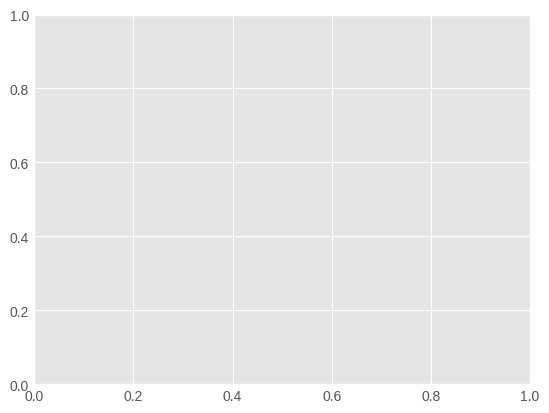

In [ ]:
num_inference_steps = 100
nb_generated_samples = 100
guidance_scale_list = torch.linspace(0, 10, nb_generated_samples).to(device)
plt.style.use("ggplot")
plt.plot(guidance_scale_list)
plt.title("Guidance scale")
plt.xlabel("'Interpolation' step")
plt.ylabel(r"$\omega$")
plt.show()
batch_size = 1  # 44GB (e.g. RTX 8000)

## Generate samples

Starting from a real sample:

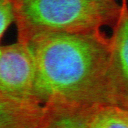

In [ ]:
sample1_to_show

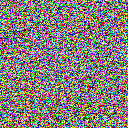

In [ ]:
latent1_to_show

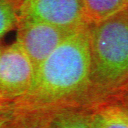

In [ ]:
inv_sample1_to_show

Get target class embedding:

In [ ]:
resolution = 128
center_crop = False
random_flip = True

augmentations = transforms.Compose(
    [
        transforms.Resize(
            resolution, interpolation=transforms.InterpolationMode.BILINEAR
        ),
        transforms.CenterCrop(resolution)
        if center_crop
        else transforms.RandomCrop(resolution),
        transforms.RandomHorizontalFlip()
        if random_flip
        else transforms.Lambda(lambda x: x),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),  # map to [-1, 1] for SiLU
    ]
)

dataset = ImageFolder(
    root=Path("data",
              "BBBC021_comp_conc_nice_phen_datalink", "train").as_posix(),
    transform=lambda x: augmentations(x.convert("RGB")),
    target_transform=lambda y: torch.tensor(y).long(),
)

In [ ]:
target_class_idx = torch.tensor(dataset.class_to_idx["cytochalasin B_0.03"], device=device).long()
print("target_class_idx:", target_class_idx)

target_class_idx: tensor(2, device='cuda:0')


In [ ]:
image_list = []

pipeline.set_progress_bar_config(disable=True)

batches: list[int] = [batch_size] * (nb_generated_samples // batch_size)
batches += [nb_generated_samples % batch_size]

for i, actual_bs in enumerate(tqdm(batches, desc="Batch")):
    batch_idxes = range(i * batch_size, i * batch_size + batches[i])
    w_batch = guidance_scale_list[batch_idxes]

    image = latent1.clone().detach().repeat(batches[i], 1, 1, 1)

    # get *fixed*, *target* class embedding
    batch_target_class_idx = target_class_idx.repeat(actual_bs)

    images_to_show = pipeline(
        class_labels=batch_target_class_idx,
        class_emb=None,
        w=w_batch,
        batch_size=actual_bs,
        num_inference_steps=num_inference_steps,
        output_type="pil",
    ).images

    image_list += images_to_show

## Visualize

In [91]:
px = 1 / plt.rcParams["figure.dpi"]  # pixel in inches
fig, ax = plt.subplots(figsize=(6, 6))

ax.imshow(image_list[0])  # show an initial one first

# ims is a list of lists, each row is a list of artists to draw in the
# current frame; here we are just animating one artist, the image, in
# each frame
ims = [[ax.imshow(image, animated=True, interpolation=None)] for image in image_list]

ax.axis("off")

ani = animation.ArtistAnimation(fig, ims, interval=10, blit=True, repeat=False)

# Save the animation
save_path = "experiments/DMSO_vs_cytoB_translation_experiments/"
video_name = f"classifier-free_gen_nb_steps{num_inference_steps}"
video_path = os.path.join(save_path, video_name)
video_formats = ["mkv", "mp4"]
for vid_format in video_formats:
    video_full_path = video_path + "." + vid_format
    if os.path.exists(video_full_path):
        timestamp = datetime.now().strftime("%Y-%m-%d-%H-%M-%S")
        warn(
            f"Video {video_full_path} already exists; writting to {video_path}-{timestamp}.{vid_format}"
        )
        ani.save(f"{video_path}-{timestamp}.{vid_format}", fps=5)
    else:
        ani.save(video_full_path, fps=5)

plt.close()

HTML(ani.to_jshtml())

No smooth interpolation, but the phenotypes are transitioning smoothly.

# DDIBs

https://arxiv.org/pdf/2203.08382.pdf

## Transfer to target classes

### Select classes

In [1]:
print(dataset.classes)

NameError: name 'dataset' is not defined

In [ ]:
target_classes = ['DMSO', 'cytochalasin B_0.01', 'cytochalasin B_0.03', 'cytochalasin B_0.1',
                  'cytochalasin B_0.3', 'cytochalasin B_1.0', 'cytochalasin B_10.0', 'cytochalasin B_3.0', 'cytochalasin B_30.0']
translated_samples = dict.fromkeys(target_classes)

### Generate

Set number of timesteps

In [ ]:
scheduler.set_timesteps(nb_noising_iter)

In [ ]:
# ! all target classes should pass through the same batch

with torch.no_grad():

    target_class_idx = torch.tensor(
        [dataset.class_to_idx[target_class] for target_class in target_classes], 
        device=device,
    )
    image = [latent1.clone().view(1, 3, resolution, resolution)] * len(target_classes)
    image = torch.cat(image, dim=0).to(device)

    for t in tqdm(scheduler.timesteps, desc="Denoising"):
        # 1. predict noise model_output
        model_output = unet(sample=image, timestep=t,
                            class_labels=target_class_idx).sample

        # 2. predict previous mean of image x_t-1 and add variance depending on eta
        # eta corresponds to η in paper and should be between [0, 1]
        # do x_t -> x_t-1
        image = scheduler.step(
            model_output,
            t,
            image,
        ).prev_sample

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Original image


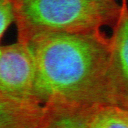

DMSO


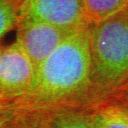

cytochalasin B_0.01


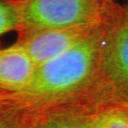

cytochalasin B_0.03


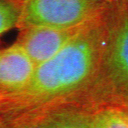

cytochalasin B_0.1


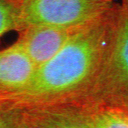

cytochalasin B_0.3


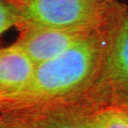

cytochalasin B_1.0


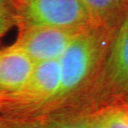

cytochalasin B_10.0


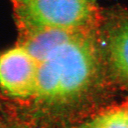

cytochalasin B_3.0


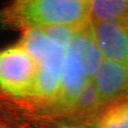

cytochalasin B_30.0


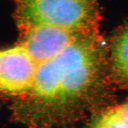

In [ ]:
print("Original image")
display(sample1_to_show)

for target_class in target_classes:
    # get position of this class in the batch
    # just in case...
    idx = dataset.class_to_idx[target_class]
    pos = torch.where(target_class_idx == idx)[0].item()
    # transform tensor to PIL
    image_to_show = image[pos]
    image_to_show = (image_to_show / 2 + 0.5).clamp(0, 1)
    image_to_show = image_to_show.cpu().permute(1, 2, 0).numpy()
    image_to_show = pipeline.numpy_to_pil(image_to_show)[0]
    print(target_class)
    display(image_to_show)